# Introduction to Convolution and Deconvolution

## 1. Convolution

In [1]:
import numpy as np
import matplotlib.pyplot as plt

from scipy import ndimage as ndi
from scipy.stats import norm
from scipy.signal import gaussian

from photutils.psf import (create_matching_kernel, CosineBellWindow, HanningWindow,
                           SplitCosineBellWindow, TopHatWindow, TukeyWindow)

from scipy.signal import convolve2d as conv2
from skimage import (color, data, restoration)

import plotly
import plotly.express as px

Text(0.5, 1.0, 'Original image')

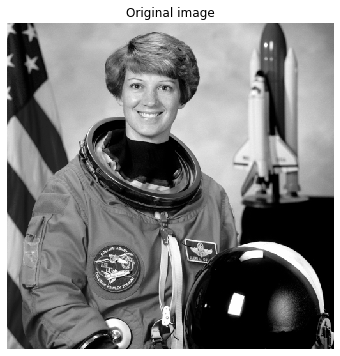

In [2]:
# retrieve example data
image = data.astronaut()
image = color.rgb2gray(image)

# original image
fig0, ax0 = plt.subplots(figsize=(7, 6))
plt.gray()

ax0.axis('off')
ax0.imshow(image)
ax0.set_title('Original image')

## 1.1. Simple Convolution Example

Let's convolve the image with a mean filter:
(https://www.researchgate.net/figure/Schematic-representation-of-mean-filtering-in-a-3X3-kernel-where-after-the-summation-of_fig1_348548607)

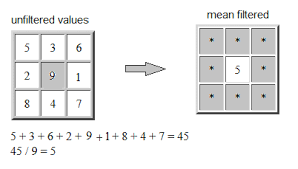

This 'mean' kernel defines the new value of a pixel by computing the mean of all the pixels that are included in the search kernel, including the central pixel itself.


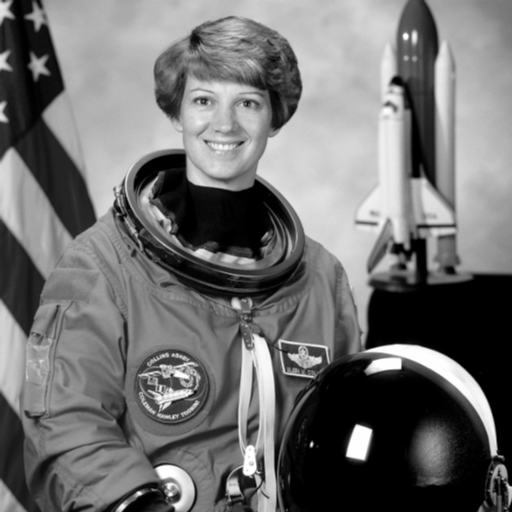
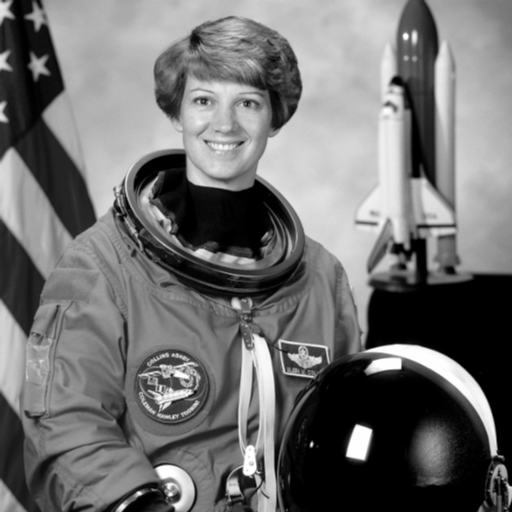
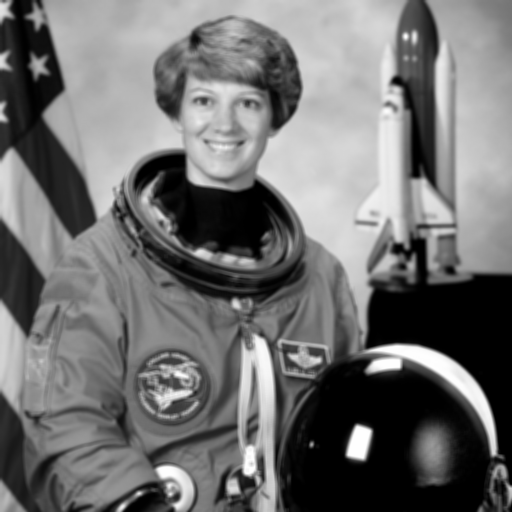
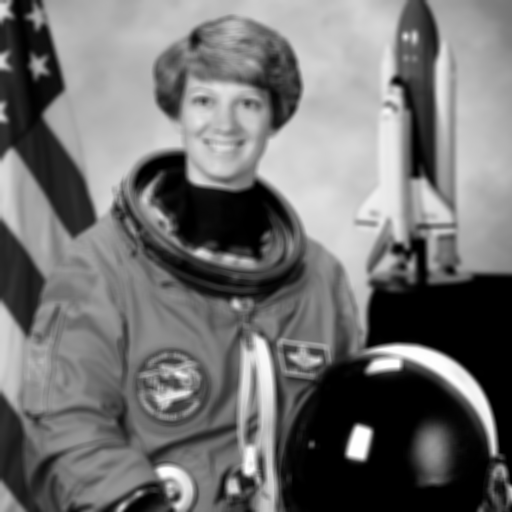
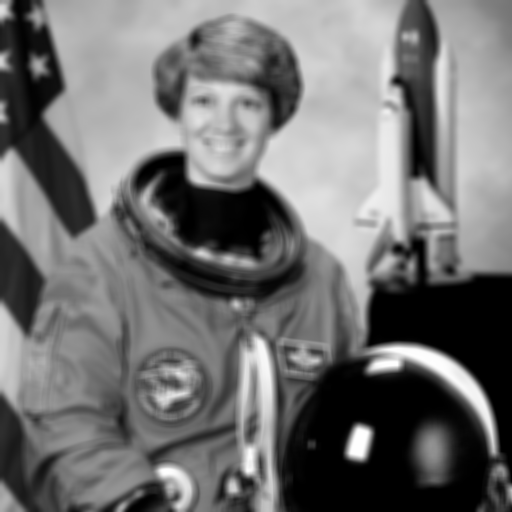
...
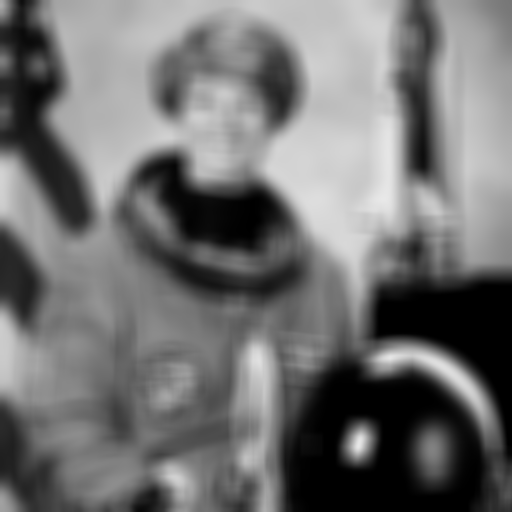
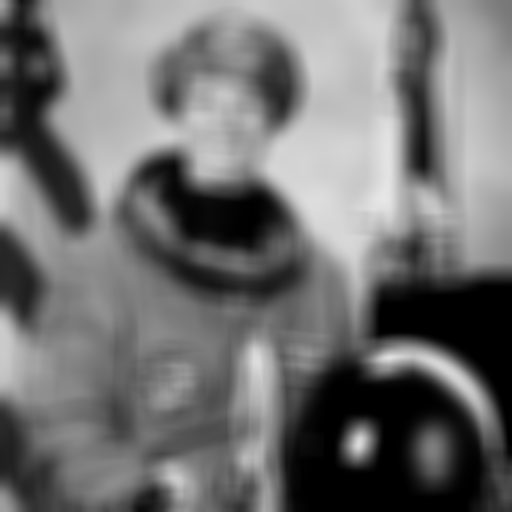
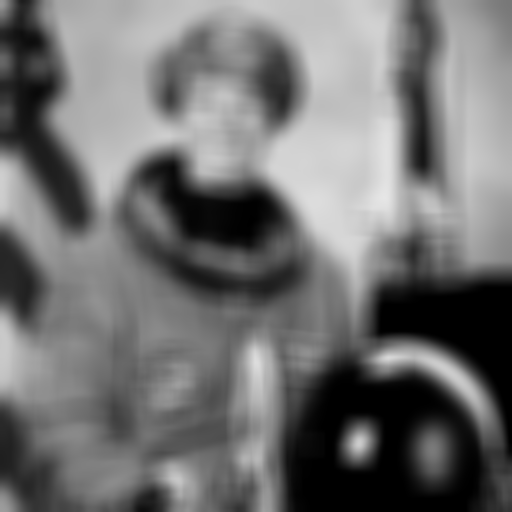
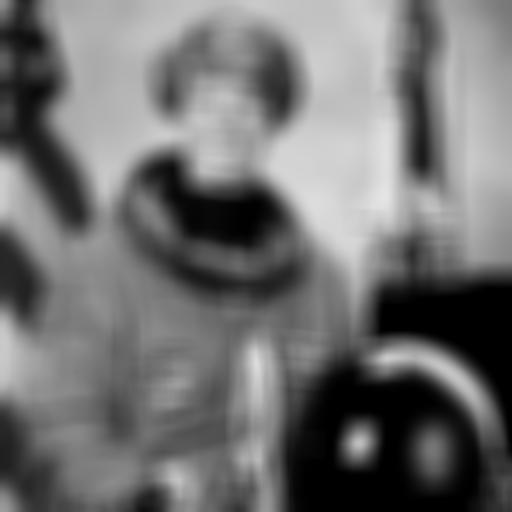
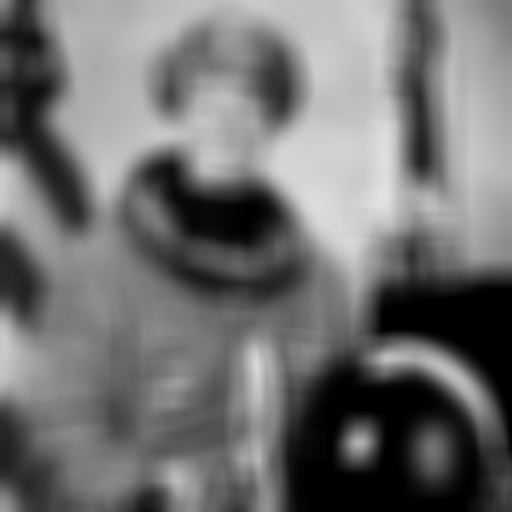

In [3]:
# convolved image: build a stack of convolved images with increasing size of the filter
convolved_images = [ndi.uniform_filter(image, size=k) for k in range(2, 32, 2)]
img_stack = np.stack(convolved_images)

fig1 = px.imshow(
    img_stack,
    animation_frame=0,
    binary_string=True,
    labels={'animation_frame': 'blur strength ~'}
)
plotly.io.show(fig1)

## 1.2. Let's convolve with a little more flexible convolution algorithm

```python
convolved_image = ndi.convolve(image, kernel, mode=convolution_mode)
```

where kernel defines the convolution kernel/filter. The different convolution modes are listed here: https://docs.scipy.org/doc/scipy/reference/generated/scipy.ndimage.convolve.html.

### 1.2.1 Define kernel

Above in 1.1. we used a mean kernel, but we can also use other kinds of kernels. One example is to build a kernel from a normalised gaussian, which is then used as weights to convolve the image.

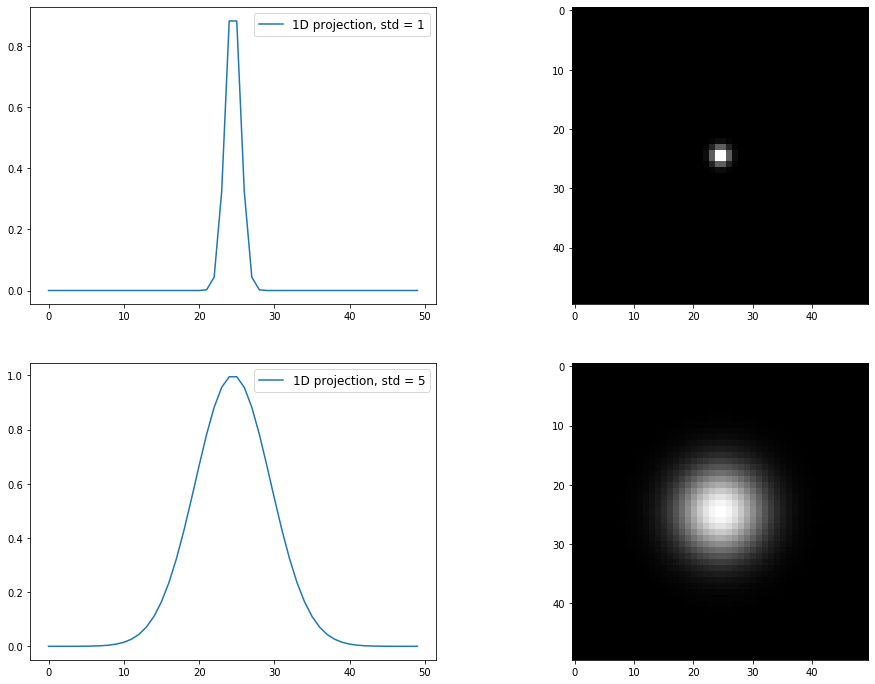

In [4]:
def gaussian_kernel_1d(n, std):
    return gaussian(n, std)

def gaussian_kernel_2d(n, std, normalised=False):
    '''
    Generates a n x n matrix with a centered gaussian 
    of standard deviation std centered on it. If normalised,
    its volume equals 1.'''
    gaussian1D = gaussian_kernel_1d(n, std)
    gaussian2D = np.outer(gaussian1D, gaussian1D)
    if normalised:
        gaussian2D /= (2*np.pi*(std**2))
    return gaussian2D

n, std1 = 50, 1
gauss1d_1 = gaussian_kernel_1d(n,std1)
gauss2d_1 = gaussian_kernel_2d(n,std1, True) 

std2      = 5
gauss1d_2 = gaussian_kernel_1d(n,std2)
gauss2d_2 = gaussian_kernel_2d(n,std2, True) 


fig2,ax2 = plt.subplots(nrows=2, ncols=2, figsize=(16,12))
ax2[0,0].plot(gauss1d_1, label='1D projection, std = {}'.format(std1))
ax2[0,0].legend(fontsize='12')
ax2[0,1].imshow(gauss2d_1)

ax2[1,0].plot(gauss1d_2, label='1D projection, std = {}'.format(std2))
ax2[1,0].legend(fontsize='12')
ax2[1,1].imshow(gauss2d_2)

plt.show()


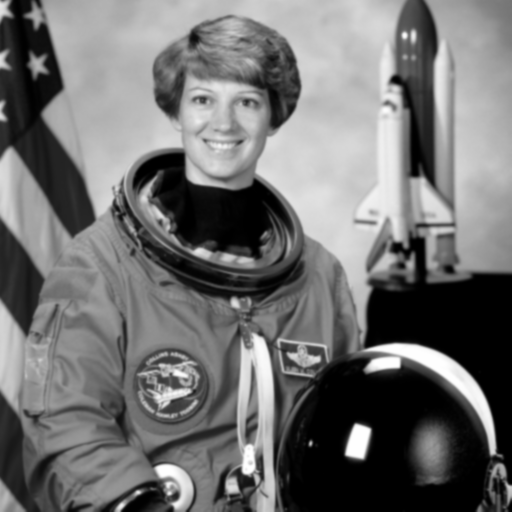
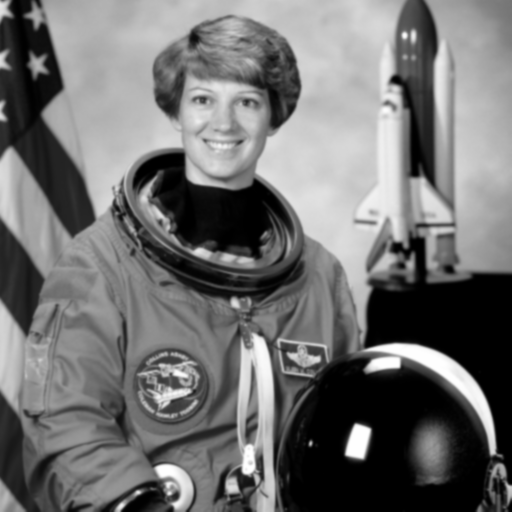
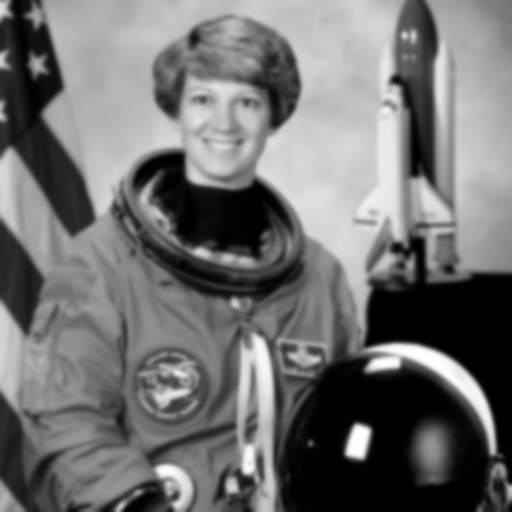
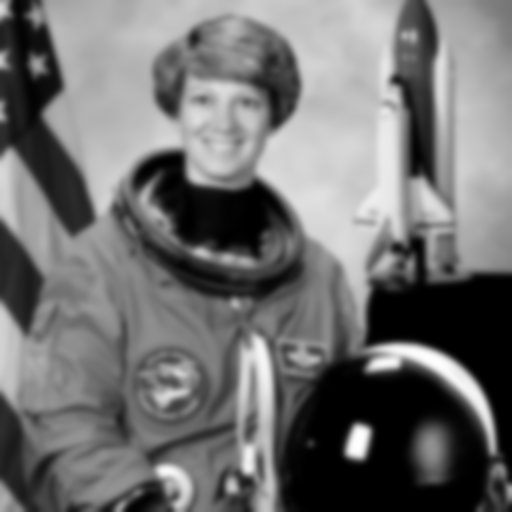
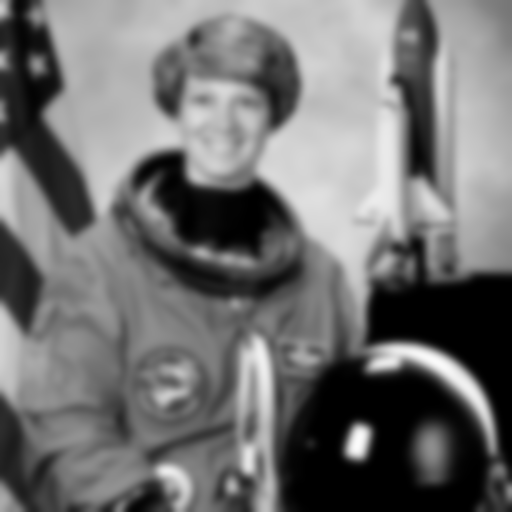
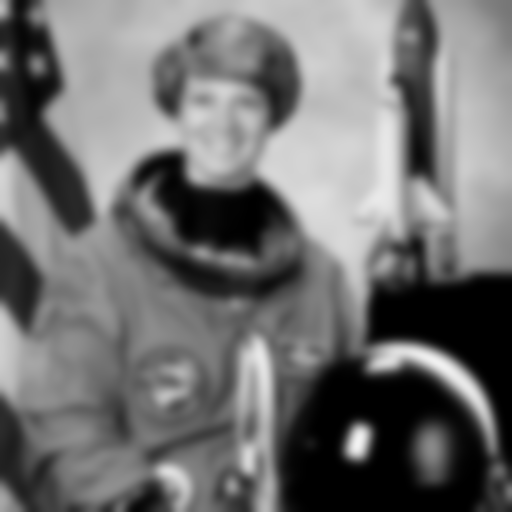
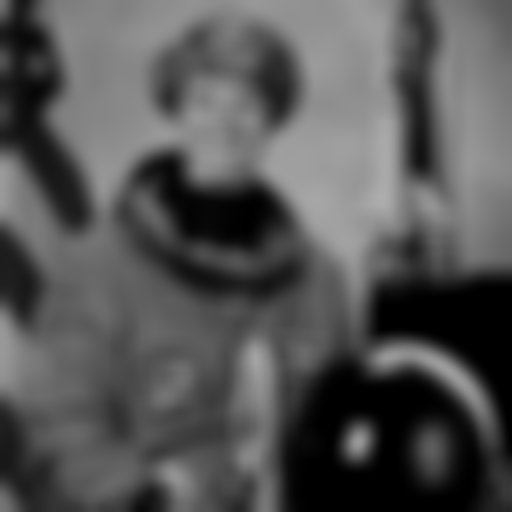
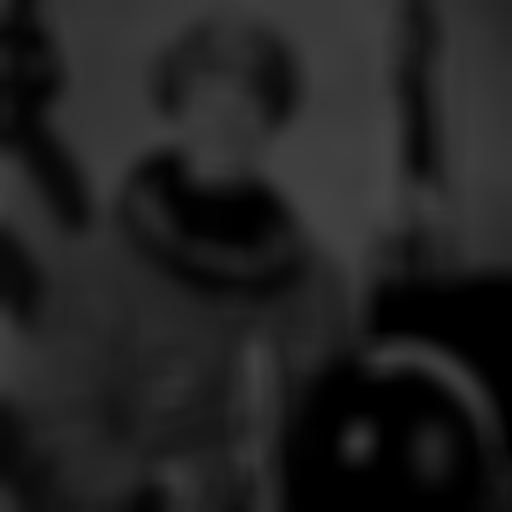

In [5]:
# convolved image: build a stack of convolved images with increasing standard deviation
std_var                = [1,2,3,4,5,10,20]
convolved_images_gauss = [ndi.convolve(image, gaussian_kernel_2d(30,s,True)) for s in std_var]
img_gauss_stack        = np.stack(convolved_images_gauss)

fig3 = px.imshow(
    img_gauss_stack,
    animation_frame=0,
    binary_string=True,
    labels={'animation_frame': 'blur strength ~'}
)
plotly.io.show(fig3)

Defining the kernel is a science. For most instruments, it is possible to find definitions/other kind of info of the Point Spread Function (PSF). This is useful when one wants to convolve for example simulated observations to the resolution of the instrument.

### 1.2.2 Variable Point Spread Function

What if the PSF depends on wavelength (as it does for many instruments, for example MUSE)?

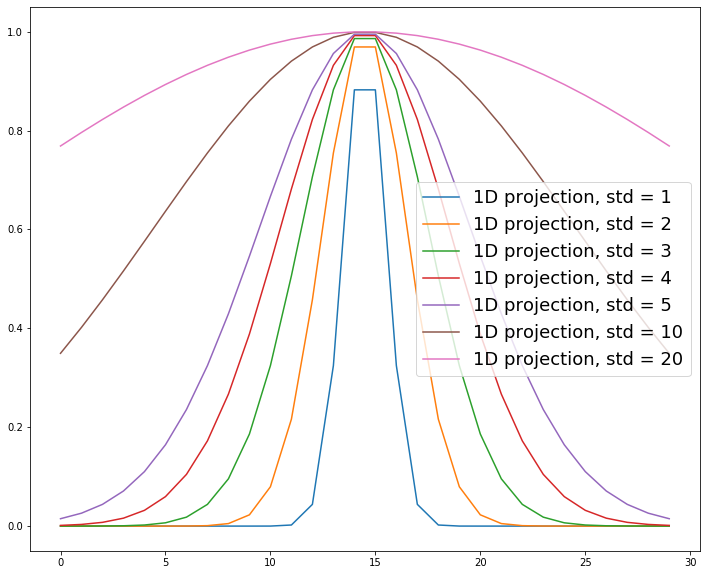

In [6]:
# define 1d gaussian with. increasing standard deviation
gauss1d_var_std = [gaussian_kernel_1d(30, i) for i in std_var] 

fig4,ax4 = plt.subplots(figsize=(12,10))
for j in range(len(std_var)):
    gauss = gauss1d_var_std[j]
    ax4.plot(gauss, label='1D projection, std = {}'.format(std_var[j]))
    ax4.legend(fontsize='18')

plt.show()

Then it is best to define a kernel that matches each of these to the desired resolution.

### 1.3 Matching Kernel

https://photutils.readthedocs.io/en/stable/psf_matching.html

```
kernel_matched = create_matching_kernel(source_kernel, target_kernel, window)
```

where the window adds additional weight to the process. See the different window definitions below.

(0, 1.1)

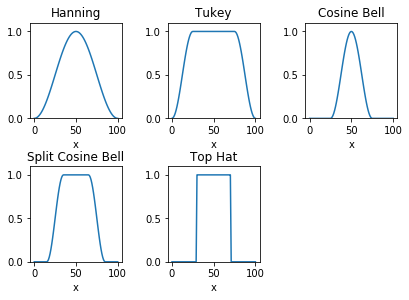

In [7]:
w1 = HanningWindow()
w2 = TukeyWindow(alpha=0.5)
w3 = CosineBellWindow(alpha=0.5)
w4 = SplitCosineBellWindow(alpha=0.4, beta=0.3)
w5 = TopHatWindow(beta=0.4)
shape = (101, 101)
y0 = (shape[0] - 1) // 2

plt.figure()
plt.subplots_adjust(left=0.1, bottom=0.1, right=0.95, top=0.93,
                    wspace=0.5, hspace=0.5)

plt.subplot(2, 3, 1)
plt.plot(w1(shape)[y0, :])
plt.title('Hanning')
plt.xlabel('x')
plt.ylim((0, 1.1))

plt.subplot(2, 3, 2)
plt.plot(w2(shape)[y0, :])
plt.title('Tukey')
plt.xlabel('x')
plt.ylim((0, 1.1))

plt.subplot(2, 3, 3)
plt.plot(w3(shape)[y0, :])
plt.title('Cosine Bell')
plt.xlabel('x')
plt.ylim((0, 1.1))

plt.subplot(2, 3, 4)
plt.plot(w4(shape)[y0, :])
plt.title('Split Cosine Bell')
plt.xlabel('x')
plt.ylim((0, 1.1))

plt.subplot(2, 3, 5)
plt.plot(w5(shape)[y0, :], label='Top Hat')
plt.title('Top Hat')
plt.xlabel('x')
plt.ylim((0, 1.1))

We can choose to convolve everything to the 'worst' resolution, which we define now as std=4.

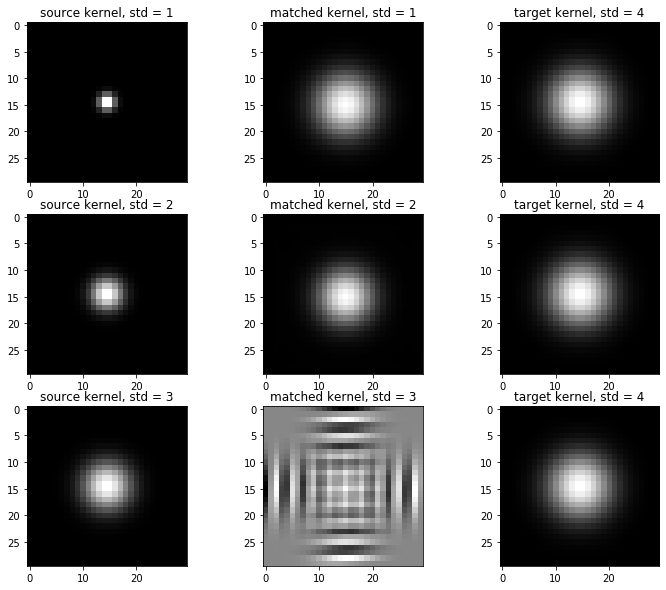

In [11]:
# Define a function that produces different windows for blurring
def windows_for_matching_kernel(data, *specs):
    
    class Window_switcher(object):
            
        def choose_window(self, data, *specs):
            method_name = 'window_' + str(*specs)
            method      = getattr(self, method_name, lambda: 'Invalid blur function in muse_blur_cube.py')
            return method(data)

        def window_hanning(self, data):
            return HanningWindow()

        def window_cosine_bell(self, data):
            window_alpha, window_beta = data
            return CosineBellWindow(window_alpha)
        
        def window_split_cosine_bell(self, data):
            window_alpha, window_beta = data
            return SplitCosineBellWindow(window_alpha, window_beta)

        def window_tukey(self, data):
            window_alpha, window_beta = data
            return TukeyWindow(window_alpha)
        
        def window_tophat(self, data):
            window_alpha, window_beta = data
            return TopHatWindow(window_beta)
            
    windows_for_matching_kernel = Window_switcher()
    window          = windows_for_matching_kernel.choose_window(data, *specs)
    return window    


# Define the source kernels that will be matched, and the target kernel
std_var_2      = [1,2,3]
source_kernels = [gaussian_kernel_2d(30,k,True) for k in std_var_2]

# Define target kernel
std_target     = 4
target_kernel  = gaussian_kernel_2d(30,std_target,True)

# Define window through which a matching kernel will be identified
width, height  = 0.4,0.3
window_id      = ['hanning', 'cosine_bell', 'split_cosine_bell', 'tukey', 'tophat']
window         = windows_for_matching_kernel([width, height], window_id[2])


fig5,ax5 = plt.subplots(nrows=len(std_var_2), ncols=3, figsize=(12,10))

for l in range(len(std_var_2)):
    #plot target kernel (always the same)
    ax5[l,2].imshow(target_kernel, label='targed kernel, std = {}'.format(std_target))
    ax5[l,2].set(title='target kernel, std = {}'.format(std_target))
    
    # plot source kernels
    ax5[l,0].imshow(source_kernels[l])
    ax5[l,0].set(title='source kernel, std = {}'.format(std_var[l]))
    
    # create and plot matching kernels for each of the source kernels
    kernel_matched = create_matching_kernel(source_kernels[l], target_kernel, window=window)
    ax5[l,1].imshow(kernel_matched)
    ax5[l,1].set(title='matched kernel, std = {}'.format(std_var_2[l]))
    
plt.show()




Choosing the right window is also a science, see more information here: https://en.wikipedia.org/wiki/Window_function.

# 2. Deconvolution

Instead of convolving i.e. making the resolution worse, we can also deconvolve i.e. artificially improve the resolution of an image.

There are many different image restoration/deconvolution algorithms, I focus here on the Richardson-Lucy algorithm.

https://scikit-image.org/docs/stable/auto_examples/filters/plot_deconvolution.html

https://en.wikipedia.org/wiki/Richardson–Lucy_deconvolution

```python
deconvolved_image = restoration.richardson_lucy(image, psf, num_iter)
```

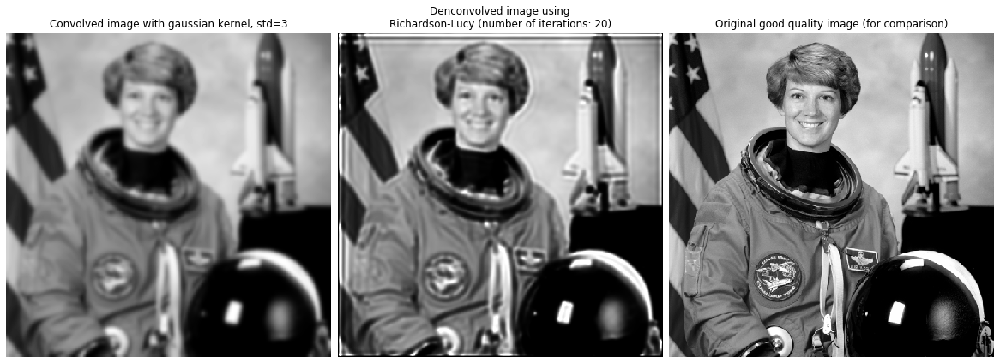

In [14]:
# define psf for convolution and convolve original image
psf             = gaussian_kernel_2d(30,3,True)
convolved_image = ndi.convolve(image, psf)

# Restore Image using Richardson-Lucy algorithm
num_iter = 20
deconvolved_image = restoration.richardson_lucy(convolved_image, psf, num_iter)

fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(16, 10))
plt.gray()

for a in (ax[0], ax[1], ax[2]):
       a.axis('off')

ax[0].imshow(convolved_image)
ax[0].set_title('Convolved image with gaussian kernel, std=3')

ax[1].imshow(deconvolved_image)#, vmin=astro_noisy.min(), vmax=astro_noisy.max())
ax[1].set_title('Denconvolved image using\nRichardson-Lucy (number of iterations: {})'.format(num_iter))

ax[2].imshow(image)
ax[2].set_title('Original good quality image (for comparison)')

fig.subplots_adjust(wspace=0.02, hspace=0.2,
                    top=0.9, bottom=0.05, left=0, right=1)
plt.show()


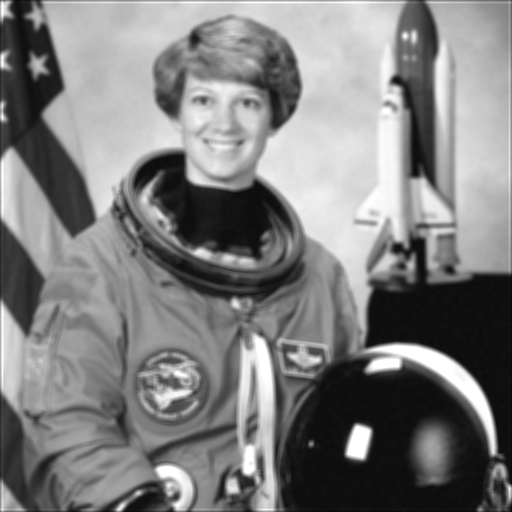
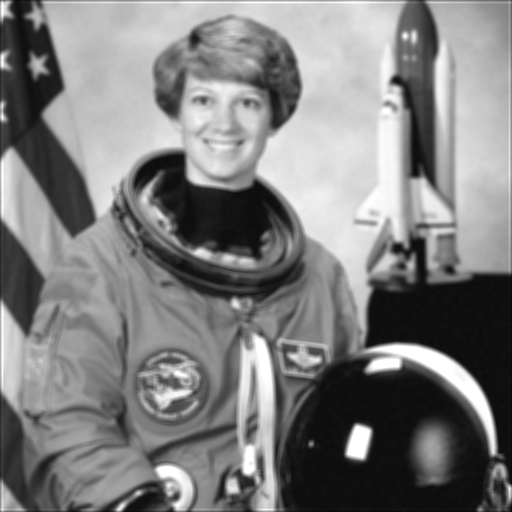
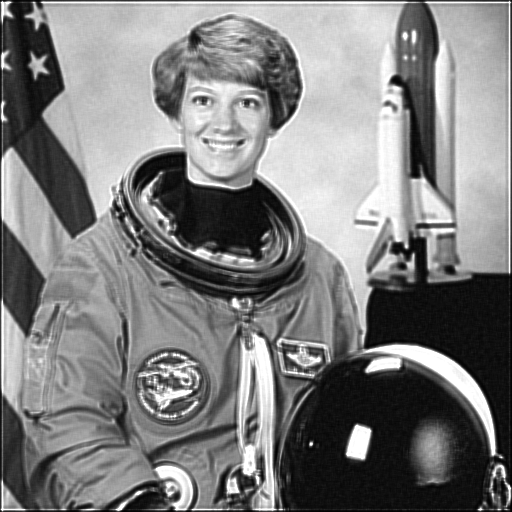
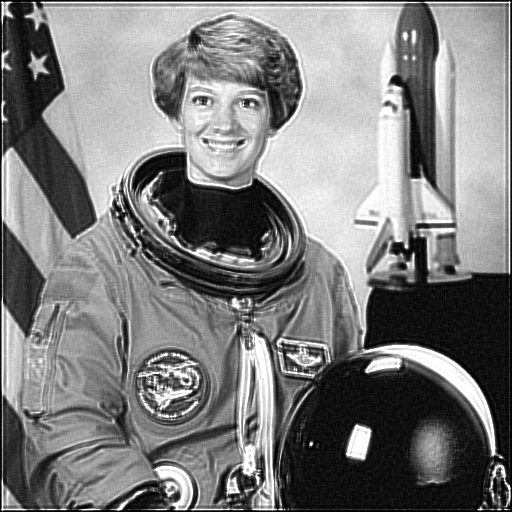
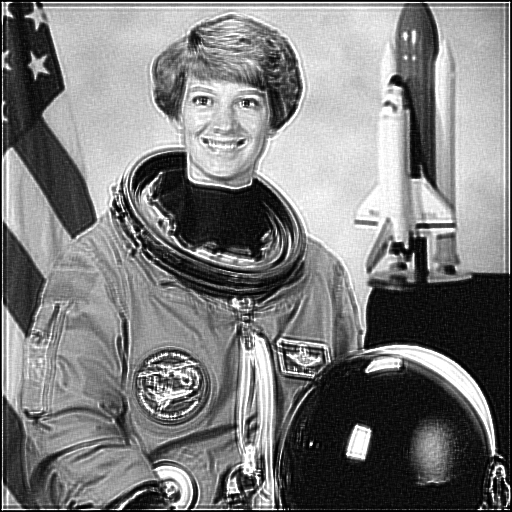
...
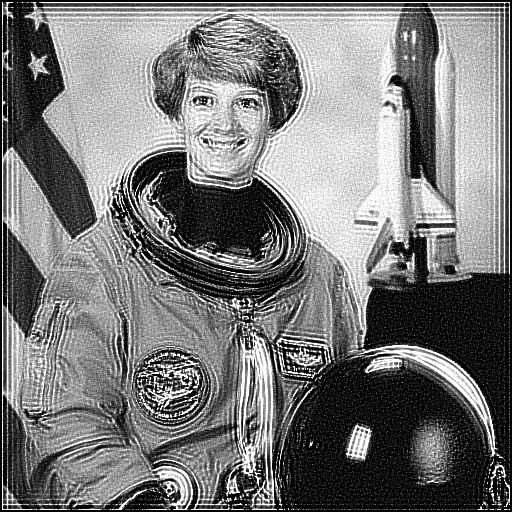
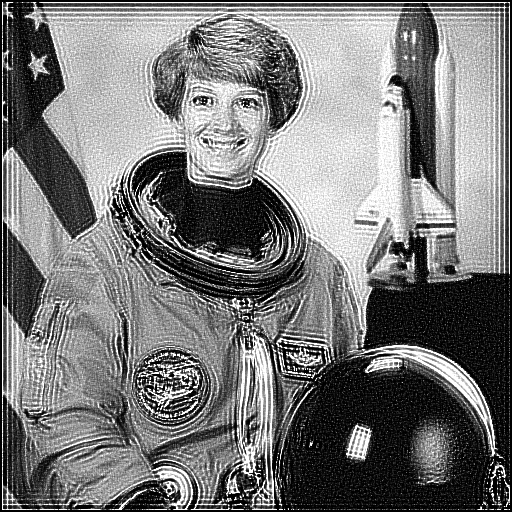
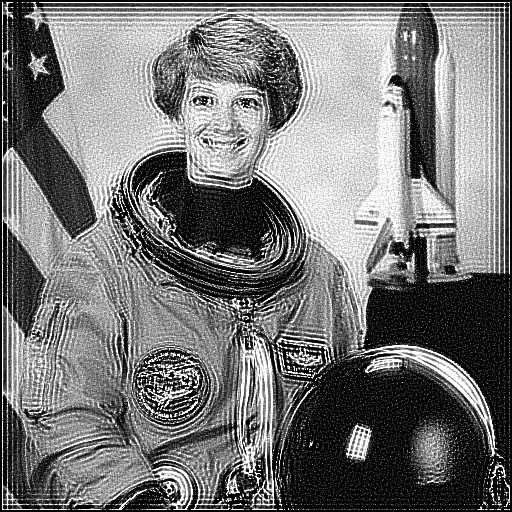
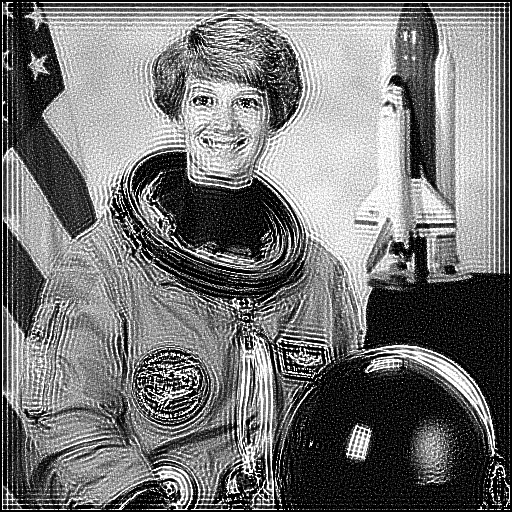
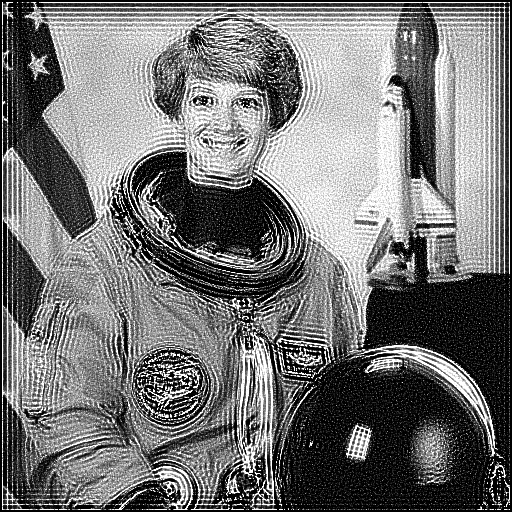

In [16]:
# retrieve fresh image
image = color.rgb2gray(data.astronaut())

# create a psf to be used to convolve the original and later deconvolved the convolved one
rng = np.random.default_rng()
psf = np.ones((5, 5)) / 25

# now create a noisy image by convolving and adding noise
convolved_image = conv2(deconvolved_image, psf, 'same')
# Add Noise to Image
noisy_image = image.copy()
noisy_image += (rng.poisson(lam=25, size=image.shape) - 10) / 255.

# Restore Image using Richardson-Lucy algorithm with increasing number of iterations
num_iter_var = [1,5,10,15,20,25,30,35,40,45,50,55,60,70,80,90,130,160,200]
deconvolved_images = [restoration.richardson_lucy(noisy_image, psf, num_iter) for num_iter in num_iter_var]
img_stack_deconv = np.stack(deconvolved_images)


fig = px.imshow(
    img_stack_deconv,
    animation_frame=0,
    binary_string=True,
    labels={'animation_frame': 'number of iterations ~'}
)
plotly.io.show(fig)

The weakness of this algorithm is that it is unclear what is the best number of iterations. See a recent paper where this algorithm is used in astronomy and where they discuss this caveat: https://iopscience.iop.org/article/10.3847/1538-4357/acd9b3/pdf